<a href="https://colab.research.google.com/github/ali-workshop/timeSeriesForcasting-Air-Pollution-PM10-PM2.5-SON-NOX/blob/main/PM10Forcastingorginal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# import Libraries

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.seasonal import seasonal_decompose
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, BatchNormalization, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from keras.preprocessing.sequence import TimeseriesGenerator
import tensorflow as tf
import datetime

# read the Dataset

In [ ]:
file_path = '/content/data.xlsx'
data = pd.read_excel(file_path)

# Explore Dataset

In [ ]:
data.head()

,Year,Month,Day,HR,T2M,RH2M,PRECTOTCORR,WS10M,WD10M,PM10
0,2019,1,1,0,3.175,90.315,0.0,6.285,73.615,53.6
1,2019,1,1,1,3.005,89.655,0.0,6.245,73.985,50.6
2,2019,1,1,2,3.220,90.940,0.0,6.240,73.650,42.8
3,2019,1,1,3,3.130,89.690,0.0,6.330,73.580,42.9
4,2019,1,1,4,2.880,89.620,0.0,6.160,74.390,44.8


In [ ]:
data.columns

Index(['Year', 'Month', 'Day', 'HR', 'T2M', 'RH2M', 'PRECTOTCORR', 'WS10M',
       'WD10M', 'PM10'],
      dtype='object')

In [ ]:
data.dtypes

Year             int64
Month            int64
Day              int64
HR               int64
T2M            float64
RH2M           float64
PRECTOTCORR    float64
WS10M          float64
WD10M          float64
PM10            object
dtype: object

In [ ]:
data['PM10'].isnull().sum()

55

# explore Data using plots

In [ ]:
# in progress

# Preproessing Dataset

In [ ]:
# Ensure columns are present and convert to integers if necessary
data['Year'] = data['Year'].astype(int)
data['Month'] = data['Month'].astype(int)
data['Day'] = data['Day'].astype(int)
data['HR'] = data['HR'].astype(int)

In [ ]:

data['PM10'] = data['PM10'].replace('-', 33)
# Convert PM10 to float
data['PM10'] = data['PM10'].astype(float)

In [ ]:

# Create a new column for datetime parsing
data['Timestamp'] = pd.to_datetime(data['Year'].astype(str) + '-' +
                                   data['Month'].astype(str) + '-' +
                                   data['Day'].astype(str) + ' ' +
                                   data['HR'].astype(str), format='%Y-%m-%d %H')

# Set the 'Timestamp' column as the index
data.set_index('Timestamp', inplace=True)

# Drop the original Year, Month, Day, and HR columns
data.drop(['Year', 'Month', 'Day', 'HR'], axis=1, inplace=True)

# Sort by datetime index
data.sort_index(inplace=True)

In [ ]:
data.head(24)

,T2M,RH2M,PRECTOTCORR,WS10M,WD10M,PM10
Timestamp,,,,,,
2019-01-01 00:00:00,3.175,90.315,0.00,6.285,73.615,53.6
2019-01-01 01:00:00,3.005,89.655,0.00,6.245,73.985,50.6
2019-01-01 02:00:00,3.220,90.940,0.00,6.240,73.650,42.8
2019-01-01 03:00:00,3.130,89.690,0.00,6.330,73.580,42.9
2019-01-01 04:00:00,2.880,89.620,0.00,6.160,74.390,44.8
2019-01-01 05:00:00,2.900,88.500,0.00,6.180,74.680,36.1
2019-01-01 06:00:00,2.900,87.810,0.00,6.320,74.520,34.9
2019-01-01 07:00:00,2.900,87.310,0.00,6.430,74.140,32.6
2019-01-01 08:00:00,3.670,83.060,0.00,6.830,75.300,28.0


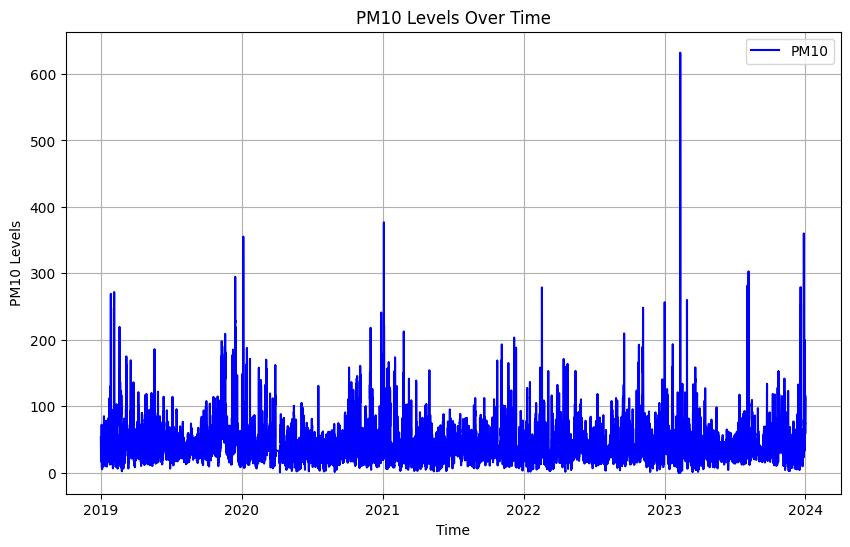

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Plot the data
plt.figure(figsize=(10, 6))
plt.plot(data.index, data['PM10'], label='PM10', color='b')
plt.xlabel('Time')
plt.ylabel('PM10 Levels')
plt.title('PM10 Levels Over Time')
plt.legend()
plt.grid(True)
plt.show()


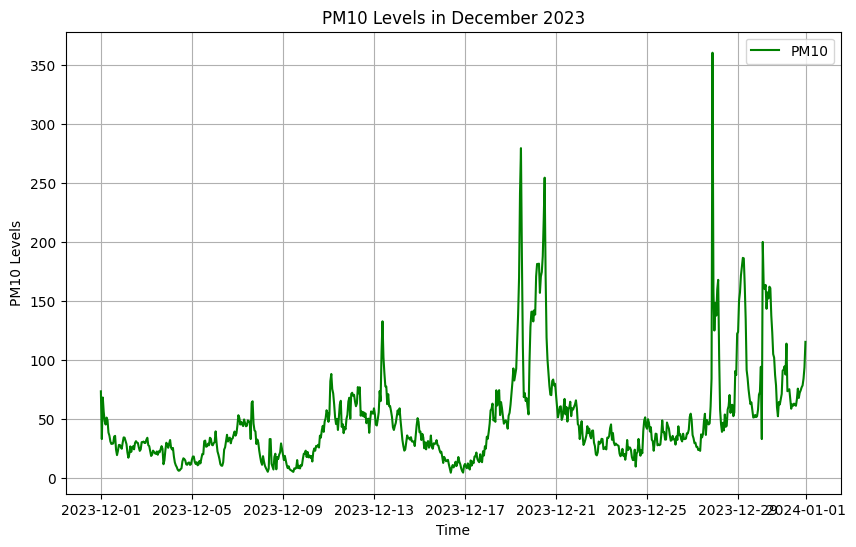

In [ ]:

# Filter the data for December 2023
december_2023_data = data[(data.index.year == 2023) & (data.index.month == 12)]

# Plot the data for December 2023
plt.figure(figsize=(10, 6))
plt.plot(december_2023_data.index, december_2023_data['PM10'], label='PM10', color='g')
plt.xlabel('Time')
plt.ylabel('PM10 Levels')
plt.title('PM10 Levels in December 2023')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
december_2023_data["PM10"][645]

360.1

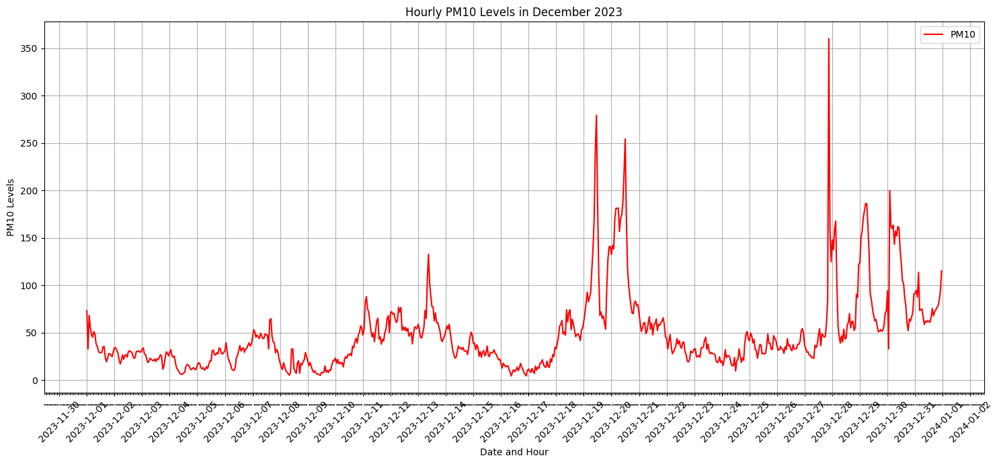

In [ ]:
import matplotlib.dates as mdates
# Filter the data for December 2023
december_2023_data = data[(data.index.year == 2023) & (data.index.month == 12)]

# Resample the data by hour and calculate the mean PM10 levels for each hour
hourly_december_2023_data = december_2023_data.resample('H').mean()

# Plot the data for December 2023 aggregated by hour
plt.figure(figsize=(15, 7))
plt.plot(hourly_december_2023_data.index, hourly_december_2023_data['PM10'], label='PM10', color='r')

# Formatting the x-axis to show dates and hours
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
plt.gca().xaxis.set_minor_locator(mdates.HourLocator(interval=1))  # Minor ticks every hour
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_minor_formatter(mdates.DateFormatter('.'))

plt.xlabel('Date and Hour')
plt.ylabel('PM10 Levels')
plt.title('Hourly PM10 Levels in December 2023')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
data.dtypes

T2M            float64
RH2M           float64
PRECTOTCORR    float64
WS10M          float64
WD10M          float64
PM10           float64
dtype: object

In [ ]:
# Define the number of lagged features
num_lags = 2  # Number of lagged features
lag_interval = 12 # Interval of lagging in hours

# Create lagged features for the target variable (PM10)
for lag in range(1, num_lags + 1):
    data[f'PM10_lag_{lag * lag_interval}'] = data['PM10'].shift(lag * lag_interval)


In [ ]:

# # # # Create rolling mean and standard deviation features
data['PM10_roll_mean_12'] = data['PM10'].rolling(window=12).mean() #6 it was
data['PM10_roll_std_12'] = data['PM10'].rolling(window=12).std() #6


In [ ]:
import numpy as np

# # Create cyclical features for hour
data['HR_sin'] = np.sin(2 * np.pi * data.index.hour / 24)
data['HR_cos'] = np.cos(2 * np.pi * data.index.hour / 24)


In [ ]:
# Drop rows with NaN values created by shifting and decomposition
data.dropna(inplace=True)


In [ ]:

from statsmodels.tsa.seasonal import seasonal_decompose

# # Perform seasonal decomposition
result = seasonal_decompose(data['PM10'], model='additive', period=24)

# # Add decomposition features to the dataframe
data['PM10_trend'] = result.trend
data['PM10_seasonal'] = result.seasonal
data['PM10_residual'] = result.resid


In [ ]:

import numpy as np
# Drop rows with NaN values created by shifting and decomposition
data.dropna(inplace=True)

# Ensure no NaN or infinite values are present
if data.isnull().values.any():
    print("Data contains NaN values.")
if np.isinf(data.values).any():
    print("Data contains infinite values.")

In [ ]:
data.columns

Index(['T2M', 'RH2M', 'PRECTOTCORR', 'WS10M', 'WD10M', 'PM10', 'PM10_lag_12',
       'PM10_lag_24', 'PM10_roll_mean_12', 'PM10_roll_std_12', 'HR_sin',
       'HR_cos', 'PM10_trend', 'PM10_seasonal', 'PM10_residual'],
      dtype='object')

In [ ]:
# import pickle
# # Save X_train
# with open('X_train.pkl', 'wb') as f:
#     pickle.dump(X_train, f)

# # Save y_train
# with open('y_train.pkl', 'wb') as f:
#     pickle.dump(y_train, f)

# # Save X_test
# with open('X_test.pkl', 'wb') as f:
#     pickle.dump(X_test, f)

# # Save y_test
# with open('y_test.pkl', 'wb') as f:
#     pickle.dump(y_test, f)


In [ ]:

# # Later, if you need to load them back
# with open('./X_train.pkl', 'rb') as f:
#     X_train_loaded = pickle.load(f)

# with open('./y_train.pkl', 'rb') as f:
#     y_train_loaded = pickle.load(f)

# with open('./X_test.pkl', 'rb') as f:
#     X_test_loaded = pickle.load(f)

# with open('./y_test.pkl', 'rb') as f:
#     y_test_loaded = pickle.load(f)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt



# Initialize the scalers
scaler_features = MinMaxScaler()
scaler_target = MinMaxScaler()

# Fit the scalers on the appropriate columns
features = data.drop(columns=['PM10'])
target = data[['PM10']]

scaled_features = scaler_features.fit_transform(features)
scaled_target = scaler_target.fit_transform(target)

# Combine the scaled features and target back into a DataFrame
scaled_data = np.hstack([scaled_features, scaled_target])
scaled_data = pd.DataFrame(scaled_data, index=data.index, columns=data.columns)

# Split the data into training and testing sets
split_date = '2023-01-01 1:00:00'  # Split at the beginning of 2023
train_data = scaled_data[scaled_data.index < split_date]
test_data = scaled_data[scaled_data.index >= split_date]

# Function to create sequences
def create_sequences(data, seq_length, forecast_horizon):
    xs, ys = [], []
    for i in range(len(data) - seq_length - forecast_horizon + 1):
        x = data.iloc[i:i + seq_length].drop(columns=['PM10']).values
        y = data.iloc[i + seq_length:i + seq_length + forecast_horizon]['PM10'].values
        xs.append(x)
        ys.append(y)
    return np.array(xs), np.array(ys)

SEQ_LENGTH = 720  # 720 hours (assuming 24 hours per day)
FORECAST_HORIZON = 720  # 720 hours (assuming 24 hours per day)

# Create sequences from the scaled training and testing data
X_train, y_train = create_sequences(train_data, SEQ_LENGTH, FORECAST_HORIZON)
X_test, y_test = create_sequences(test_data, SEQ_LENGTH, FORECAST_HORIZON)


# Print shapes
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)


X_train shape: (33590, 720, 14)
y_train shape: (33590, 720)
X_test shape: (7015, 720, 14)
y_test shape: (7015, 720)


Epoch 1/25
840/840 [==============================] - 90s 96ms/step - loss: 0.0114 - val_loss: 0.0018 - lr: 0.0010
Epoch 2/25
840/840 [==============================] - 82s 98ms/step - loss: 0.0017 - val_loss: 0.0018 - lr: 0.0010
Epoch 3/25
840/840 [==============================] - 77s 91ms/step - loss: 0.0017 - val_loss: 0.0021 - lr: 0.0010
Epoch 4/25
840/840 [==============================] - 77s 91ms/step - loss: 0.0016 - val_loss: 0.0018 - lr: 0.0010
Epoch 5/25
840/840 [==============================] - 80s 95ms/step - loss: 0.0014 - val_loss: 0.0018 - lr: 1.0000e-04
Epoch 6/25
840/840 [==============================] - 79s 95ms/step - loss: 0.0014 - val_loss: 0.0018 - lr: 1.0000e-04
Epoch 7/25
840/840 [==============================] - 80s 95ms/step - loss: 0.0014 - val_loss: 0.0019 - lr: 1.0000e-04
Epoch 8/25
840/840 [==============================] - 82s 97ms/step - loss: 0.0014 - val_loss: 0.0018 - lr: 1.0000e-04
Epoch 9/25
840/840 [==============================] - 82s 98ms/s

<IPython.core.display.Javascript object>

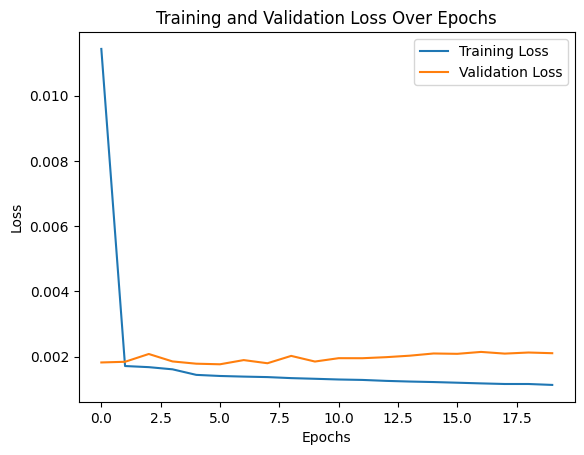

In [ ]:

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense, BatchNormalization, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import datetime
import matplotlib.pyplot as plt

# Define the LSTM model
model = Sequential()
model.add(Bidirectional(LSTM(64, return_sequences=True), input_shape=(SEQ_LENGTH, X_train.shape[2])))
model.add(Dropout(0.1))
model.add(BatchNormalization())

# model.add(Bidirectional(LSTM(64, return_sequences=True)))
# model.add(Dropout(0.1))
# model.add(BatchNormalization())

model.add(Bidirectional(LSTM(64, return_sequences=False)))
model.add(Dropout(0.1))
model.add(BatchNormalization())

model.add(Dense(FORECAST_HORIZON))  # Predicting the next `FORECAST_HORIZON` hours of PM10

# Compile the model
model.compile(optimizer='adam', loss='mean_squared_error')

# Define the log directory for TensorBoard
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")

# Create the TensorBoard callback
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

# Early stopping and learning rate reduction on plateau
early_stopping = EarlyStopping(monitor='val_loss', patience=14, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=0.0001)

# Train the model with the TensorBoard callback
history = model.fit(X_train, y_train, epochs=25, batch_size=32, validation_split=0.2,
                    callbacks=[tensorboard_callback, early_stopping, reduce_lr])

# Start TensorBoard
%load_ext tensorboard
%tensorboard --logdir logs/fit

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.legend()
plt.show()


220/220 [==============================] - 9s 38ms/step


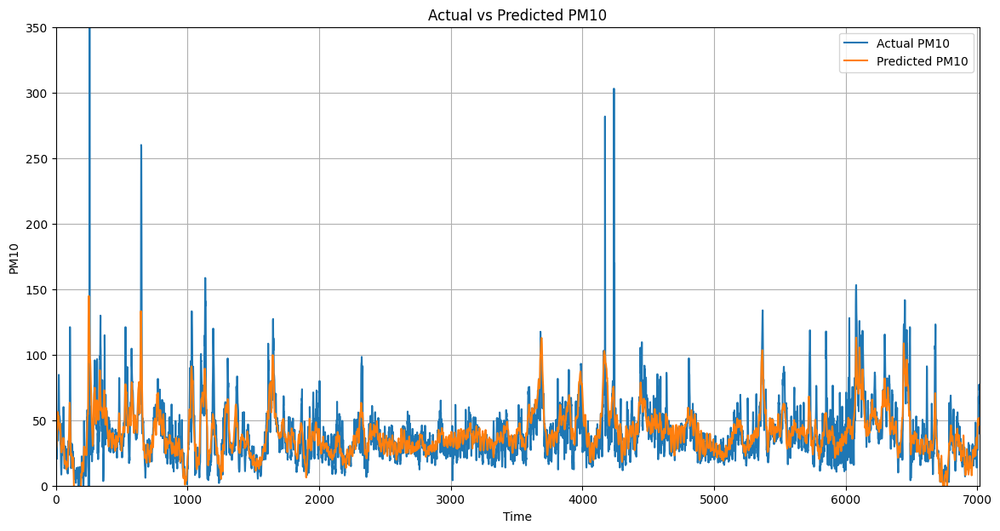

In [ ]:
# Make predictions on the test set
y_pred_scaled = model.predict(X_test)

# Inverse transform the predictions and the actual test values
y_pred = scaler_target.inverse_transform(y_pred_scaled)
y_test_original = scaler_target.inverse_transform(y_test)

# Select the first time step in the forecast horizon for comparison
y_pred_first_step = y_pred[:, 0]
y_test_original_first_step = y_test_original[:, 0]

# Create a time index for plotting
date_range = pd.date_range(start='2023-12-01', end='2023-12-30', freq='H')  # Adjust as per your actual data
time_index = np.arange(len(y_test_original_first_step))

# Plotting the results
plt.figure(figsize=(14, 7))
plt.plot(time_index, y_test_original_first_step, label='Actual PM10')
plt.plot(time_index, y_pred_first_step, label='Predicted PM10')
plt.xlabel('Time')
plt.ylabel('PM10')
plt.title('Actual vs Predicted PM10')
plt.ylim([0, 350])  # Set y-axis range from 0 to 350
plt.xlim([time_index[0], time_index[-1]])  # Set x-axis range
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
# Save the entire model to a HDF5 file
model.save('my_model.h5')


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
# # Load the model from the file
# loaded_model = tf.keras.models.load_model('my_model.h5')


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# Calculate Mean Squared Error (MSE)
mse = mean_squared_error(y_test, y_pred_scaled)

# Calculate Mean Absolute Error (MAE)
mae = mean_absolute_error(y_test, y_pred_scaled)

# Calculate Root Mean Squared Error (RMSE)
rmse = np.sqrt(mse)

# Print the evaluation metrics
print(f'Mean Squared Error (MSE): {mse:.5f}')
print(f'Mean Absolute Error (MAE): {mae:.5f}')
print(f'Root Mean Squared Error (RMSE): {rmse:.5f}')

Mean Squared Error (MSE): 0.00144
Mean Absolute Error (MAE): 0.02716
Root Mean Squared Error (RMSE): 0.03799


In [ ]:
import numpy as np

def custom_accuracy(predictions, truth, acceptance_levels):
    total = len(predictions)
    accuracies = []
    for acceptance in acceptance_levels:
        errors = np.sum(np.abs(truth - predictions) > acceptance)
        accuracy = (total - errors) / total
        accuracies.append(accuracy)

    avg_accuracy = np.mean(accuracies)
    return avg_accuracy

# Generate random acceptance levels in the range [0, 1]
np.random.seed(0)  # Set a seed for reproducibility
num_levels = 6  # Number of acceptance levels
acceptance_levels = np.random.uniform(0.2, 1.0, num_levels)

accuracy = custom_accuracy(y_pred_scaled, y_test, acceptance_levels)
print(f'Average Custom Accuracy: {accuracy * 100:.4f}%')


Average Custom Accuracy: 96.0276%


220/220 [==============================] - 8s 38ms/step


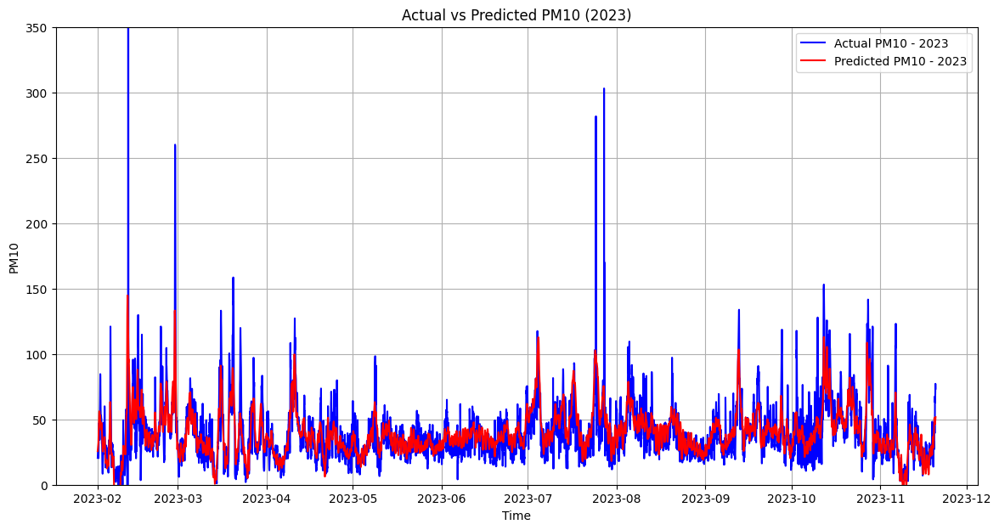

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Make predictions on the test set for 2023
y_pred_scaled = model.predict(X_test)

# Inverse transform the predictions and the actual test values
y_pred = scaler_target.inverse_transform(y_pred_scaled.reshape(-1, 1)).reshape(y_pred_scaled.shape)
y_test_original = scaler_target.inverse_transform(y_test.reshape(-1, 1)).reshape(y_test.shape)

# Select the first time step in the forecast horizon for comparison
y_pred_first_step = y_pred[:, 0]
y_test_original_first_step = y_test_original[:, 0]

# Create a time index for plotting all of 2023
date_range_2023 = pd.date_range(start='2023-02-01', end='2023-12-01', freq='H')[:len(y_test_original_first_step)]

# Plotting the results
plt.figure(figsize=(14, 7))
plt.plot(date_range_2023, y_test_original_first_step, label='Actual PM10 - 2023', color='blue')
plt.plot(date_range_2023, y_pred_first_step, label='Predicted PM10 - 2023', color='red')
plt.xlabel('Time')
plt.ylabel('PM10')
plt.title('Actual vs Predicted PM10 (2023)')
plt.ylim([0, 350])  # Set y-axis range from 0 to 350
plt.legend()
plt.grid(True)
plt.show()


1/1 [==============================] - 0s 45ms/step


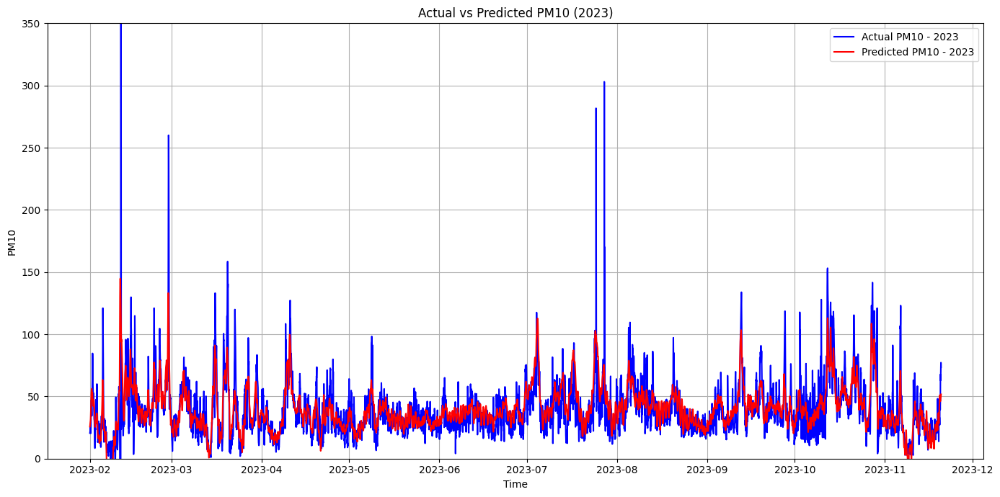

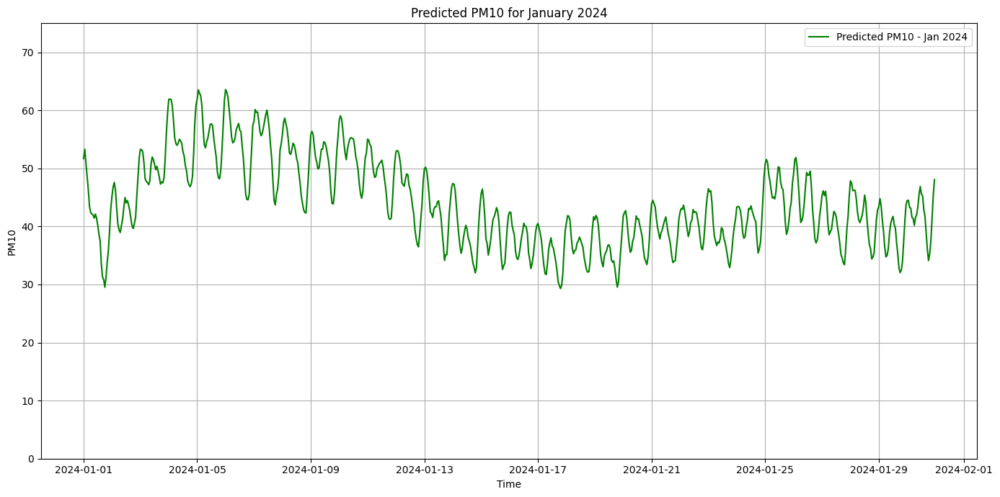

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Make predictions on the test set for 2023
y_pred_scaled = model.predict(X_test)

# Inverse transform the predictions and the actual test values for 2023
y_pred_2023 = scaler_target.inverse_transform(y_pred_scaled.reshape(-1, 1)).reshape(y_pred_scaled.shape)
y_test_original_2023 = scaler_target.inverse_transform(y_test.reshape(-1, 1)).reshape(y_test.shape)

# Select the first time step in the forecast horizon for comparison in 2023
y_pred_first_step_2023 = y_pred_2023[:, 0]
y_test_original_first_step_2023 = y_test_original_2023[:, 0]

# Create a time index for plotting all of 2023
date_range_2023 = pd.date_range(start='2023-02-01', end='2023-12-01', freq='H')[:len(y_test_original_first_step_2023)]

# Make predictions on X_test_last_sequence for January 2024
y_pred_january_scaled = model.predict(X_test_last_sequence)
y_pred_january = scaler_target.inverse_transform(y_pred_january_scaled.reshape(-1, 1)).reshape(-1)

# Create a time index for plotting January 2024
date_range_january = pd.date_range(start='2024-01-01', end='2024-01-31', freq='H')[:len(y_pred_january)]

# Plotting for 2023
plt.figure(figsize=(14, 7))
plt.plot(date_range_2023, y_test_original_first_step_2023, label='Actual PM10 - 2023', color='blue')
plt.plot(date_range_2023, y_pred_first_step_2023, label='Predicted PM10 - 2023', color='red')
plt.xlabel('Time')
plt.ylabel('PM10')
plt.title('Actual vs Predicted PM10 (2023)')
plt.ylim([0, 350])  # Set y-axis range for 2023 plot
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plotting for January 2024
plt.figure(figsize=(14, 7))
plt.plot(date_range_january, y_pred_january, label='Predicted PM10 - Jan 2024', color='green')
plt.xlabel('Time')
plt.ylabel('PM10')
plt.title('Predicted PM10 for January 2024')
plt.ylim([0, 75])  # Set y-axis range for January 2024 plot
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# start with SO2,PM2.5,NOx datasets

In [ ]:
import os
import pandas as pd

# Path to the folder containing the Excel files
data_folder = '/content/drive/MyDrive/datasets'

# Dictionary to store the DataFrames with their corresponding file names
dataframes = {}

# Iterate over all files in the specified folder
for filename in os.listdir(data_folder):
    if filename.endswith('.xlsx'):
        # Construct the full file path
        file_path = os.path.join(data_folder, filename)

        # Read the Excel file into a DataFrame
        df = pd.read_excel(file_path)

        # Create a DataFrame name based on the file name (without extension)
        df_name = 'df_' + os.path.splitext(filename)[0]

        # Store the DataFrame in the dictionary
        dataframes[df_name] = df



In [ ]:
dataframes.keys()

dict_keys(['df_PM10', 'df_SO2', 'df_NOx', 'df_PM2.5'])

In [ ]:
df_SO2= dataframes['df_SO2']
df_PM25= dataframes['df_PM2.5']
df_NOx= dataframes['df_NOx']


In [ ]:
df_NOx.head()

,Year,Month,Day,HR,T2M,RH2M,PRECTOTCORR,WS10M,WD10M,Nox
0,2019,1,1,0,3.175,90.315,0.0,6.285,73.615,-
1,2019,1,1,1,3.005,89.655,0.0,6.245,73.985,75.4
2,2019,1,1,2,3.220,90.940,0.0,6.240,73.650,67.6
3,2019,1,1,3,3.130,89.690,0.0,6.330,73.580,65.1
4,2019,1,1,4,2.880,89.620,0.0,6.160,74.390,65.4


In [ ]:
df_PM25.head()

,Year,Month,Day,HR,T2M,RH2M,PRECTOTCORR,WS10M,WD10M,"pm2,5"
0,2019,1,1,0,3.175,90.315,0.0,6.285,73.615,-
1,2019,1,1,1,3.005,89.655,0.0,6.245,73.985,26.2
2,2019,1,1,2,3.220,90.940,0.0,6.240,73.650,25
3,2019,1,1,3,3.130,89.690,0.0,6.330,73.580,20.2
4,2019,1,1,4,2.880,89.620,0.0,6.160,74.390,17.2


In [ ]:
df_SO2.head()

,Year,Month,Day,HR,T2M,RH2M,PRECTOTCORR,WS10M,WD10M,SO2
0,2019,1,1,0,3.175,90.315,0.0,6.285,73.615,4.1
1,2019,1,1,1,3.005,89.655,0.0,6.245,73.985,1.7
2,2019,1,1,2,3.220,90.940,0.0,6.240,73.650,1.8
3,2019,1,1,3,3.130,89.690,0.0,6.330,73.580,1.4
4,2019,1,1,4,2.880,89.620,0.0,6.160,74.390,1.6


In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statsmodels.tsa.seasonal import seasonal_decompose
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense, BatchNormalization, Bidirectional
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import datetime

class AirQualityModel:
    def __init__(self, df, target_column):
        self.df = df.copy()
        self.target_column = target_column
        self.scaler_features = MinMaxScaler()
        self.scaler_target = MinMaxScaler()
        self.SEQ_LENGTH = 720
        self.FORECAST_HORIZON = 720
        self.model = None

    def preprocess(self):
        # Ensure columns are present and convert to integers if necessary
        self.df['Year'] = self.df['Year'].astype(int)
        self.df['Month'] = self.df['Month'].astype(int)
        self.df['Day'] = self.df['Day'].astype(int)
        self.df['HR'] = self.df['HR'].astype(int)

        # Replace missing values in the target column with the mean of the column
        self.df[self.target_column] = self.df[self.target_column].replace('-', np.nan)
        self.df[self.target_column] = self.df[self.target_column].astype(float)
        self.df[self.target_column].fillna(self.df[self.target_column].mean(), inplace=True)

        # Create a new column for datetime parsing
        self.df['Timestamp'] = pd.to_datetime(self.df['Year'].astype(str) + '-' +
                                              self.df['Month'].astype(str) + '-' +
                                              self.df['Day'].astype(str) + ' ' +
                                              self.df['HR'].astype(str).str.zfill(2), format='%Y-%m-%d %H')

        # Set the 'Timestamp' column as the index
        self.df.set_index('Timestamp', inplace=True)

        # Drop the original Year, Month, Day, and HR columns
        self.df.drop(['Year', 'Month', 'Day', 'HR'], axis=1, inplace=True)

        # Sort by datetime index
        self.df.sort_index(inplace=True)

        # Define the number of lagged features
        num_lags = 2  # Number of lagged features
        lag_interval = 12  # Interval of lagging in hours

        # Create lagged features for the target variable
        for lag in range(1, num_lags + 1):
            self.df[f'{self.target_column}_lag_{lag * lag_interval}'] = self.df[self.target_column].shift(lag * lag_interval)

        # Create rolling mean and standard deviation features
        self.df[f'{self.target_column}_roll_mean_12'] = self.df[self.target_column].rolling(window=6).mean()
        self.df[f'{self.target_column}_roll_std_12'] = self.df[self.target_column].rolling(window=6).std()

        # Create cyclical features for hour
        self.df['HR_sin'] = np.sin(2 * np.pi * self.df.index.hour / 24)
        self.df['HR_cos'] = np.cos(2 * np.pi * self.df.index.hour / 24)

        # Drop rows with NaN values created by shifting and decomposition
        self.df.dropna(inplace=True)

        # Perform seasonal decomposition
        result = seasonal_decompose(self.df[self.target_column], model='additive', period=24)

        # Add decomposition features to the dataframe
        self.df[f'{self.target_column}_trend'] = result.trend
        self.df[f'{self.target_column}_seasonal'] = result.seasonal
        self.df[f'{self.target_column}_residual'] = result.resid

        # Drop rows with NaN values created by seasonal decomposition
        self.df.dropna(inplace=True)

    def scale_data(self):
        features = self.df.drop(columns=[self.target_column])
        target = self.df[[self.target_column]]

        scaled_features = self.scaler_features.fit_transform(features)
        scaled_target = self.scaler_target.fit_transform(target)

        scaled_data = np.hstack([scaled_features, scaled_target])
        self.scaled_data = pd.DataFrame(scaled_data, index=self.df.index, columns=self.df.columns)

    def split_data(self, split_date):
        self.train_data = self.scaled_data[self.scaled_data.index < split_date]
        self.test_data = self.scaled_data[self.scaled_data.index >= split_date]

    def create_sequences(self, data, seq_length, forecast_horizon):
        xs, ys = [], []
        for i in range(len(data) - seq_length - forecast_horizon + 1):
            x = data.iloc[i:i + seq_length].drop(columns=[self.target_column]).values
            y = data.iloc[i + seq_length:i + seq_length + forecast_horizon][self.target_column].values
            xs.append(x)
            ys.append(y)
        return np.array(xs), np.array(ys)

    def prepare_sequences(self):
        self.X_train, self.y_train = self.create_sequences(self.train_data, self.SEQ_LENGTH, self.FORECAST_HORIZON)
        self.X_test, self.y_test = self.create_sequences(self.test_data, self.SEQ_LENGTH, self.FORECAST_HORIZON)

    def build_model(self):
        model = Sequential()
        model.add(Bidirectional(LSTM(64, return_sequences=True), input_shape=(self.SEQ_LENGTH, self.X_train.shape[2])))
        model.add(Dropout(0.1))
        model.add(BatchNormalization())

        model.add(Bidirectional(LSTM(64, return_sequences=False)))
        model.add(Dropout(0.1))
        model.add(BatchNormalization())

        model.add(Dense(self.FORECAST_HORIZON))

        model.compile(optimizer='adam', loss='mean_squared_error')
        self.model = model

    def train_model(self):
        log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)
        early_stopping = EarlyStopping(monitor='val_loss', patience=14, restore_best_weights=True)
        reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=0.0001)

        history = self.model.fit(self.X_train, self.y_train, epochs=25, batch_size=32, validation_split=0.2,
                                 callbacks=[tensorboard_callback, early_stopping, reduce_lr])
        self.model.save(f'{self.target_column}.h5')

        # Plot training and validation loss
        plt.plot(history.history['loss'], label='Training Loss')
        plt.plot(history.history['val_loss'], label='Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title('Training and Validation Loss Over Epochs')
        plt.legend()
        plt.show()

    def evaluate_model(self):
        y_pred_scaled = self.model.predict(self.X_test)

        y_pred = self.scaler_target.inverse_transform(y_pred_scaled)
        y_test_original = self.scaler_target.inverse_transform(self.y_test)

        mse = mean_squared_error(self.y_test, y_pred_scaled)
        mae = mean_absolute_error(self.y_test, y_pred_scaled)
        rmse = np.sqrt(mse)

        print(f'Mean Squared Error (MSE): {mse:.5f}')
        print(f'Mean Absolute Error (MAE): {mae:.5f}')
        print(f'Root Mean Squared Error (RMSE): {rmse:.5f}')

        self.y_pred = y_pred
        self.y_test_original = y_test_original

    def custom_accuracy(self):
        y_pred_scaled = self.model.predict(self.X_test)
        np.random.seed(0)  # Set a seed for reproducibility
        num_levels = 4  # Number of acceptance levels
        acceptance_levels = np.random.uniform(0.2, 1.0, num_levels)
        total = len(y_pred_scaled)
        accuracies = []
        for acceptance in acceptance_levels:
            errors = np.sum(np.abs(self.y_test - y_pred_scaled) > acceptance)
            accuracy = (total - errors) / total
            accuracies.append(accuracy)

        avg_accuracy = np.mean(accuracies)
        return avg_accuracy

    def plot_results(self):
        y_pred_first_step = self.y_pred[:, 0]
        y_test_original_first_step = self.y_test_original[:, 0]

        time_index = np.arange(len(y_test_original_first_step))

        plt.figure(figsize=(14, 7))
        plt.plot(time_index, y_test_original_first_step, label=f'Actual {self.target_column}')
        plt.plot(time_index, y_pred_first_step, label=f'Predicted {self.target_column}')
        plt.xlabel('Time')
        plt.ylabel(f'{self.target_column}')
        plt.title(f'Actual vs Predicted {self.target_column}')
        plt.ylim([0, 350])
        plt.xlim([time_index[0], time_index[-1]])
        plt.legend()
        plt.grid(True)
        plt.show()

    def plot_forecast_1_2024(self):
        # Make predictions on the test set for 2023
        # Make predictions on the test set for 2023
        y_pred_scaled = self.model.predict(self.X_test)

        # Inverse transform the predictions and the actual test values for 2023
        y_pred_2023 = self.scaler_target.inverse_transform(y_pred_scaled.reshape(-1, 1)).reshape(y_pred_scaled.shape)
        y_test_original_2023 = self.scaler_target.inverse_transform(self.y_test.reshape(-1, 1)).reshape(self.y_test.shape)

        # Select the first time step in the forecast horizon for comparison in 2023
        y_pred_first_step_2023 = y_pred_2023[:, 0]
        y_test_original_first_step_2023 = y_test_original_2023[:, 0]

        # Create a time index for plotting all of 2023
        date_range_2023 = pd.date_range(start='2023-02-01', periods=len(y_test_original_first_step_2023), freq='H')

        # Extract the last sequence from the test data for predictions for January 2024
        X_test_last_sequence = self.X_test[-1].reshape(1, self.X_test.shape[1], self.X_test.shape[2])

        # Make predictions on X_test_last_sequence for January 2024
        y_pred_january_scaled = self.model.predict(X_test_last_sequence)
        y_pred_january = self.scaler_target.inverse_transform(y_pred_january_scaled.reshape(-1, 1)).reshape(-1)

        # Create a time index for plotting January 2024
        date_range_january = pd.date_range(start='2024-01-01', periods=len(y_pred_january), freq='H')

        # Plotting for 2023
        plt.figure(figsize=(14, 7))
        plt.plot(date_range_2023, y_test_original_first_step_2023, label='Actual PM10 - 2023', color='blue')
        plt.plot(date_range_2023, y_pred_first_step_2023, label='Predicted PM10 - 2023', color='red')
        plt.xlabel('Time')
        plt.ylabel('PM10')
        plt.title('Actual vs Predicted PM10 (2023)')
        plt.ylim([0, 350])  # Set y-axis range for 2023 plot
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

        # Plotting for January 2024
        plt.figure(figsize=(14, 7))
        plt.plot(date_range_january, y_pred_january, label='Predicted PM10 - Jan 2024', color='green')
        plt.xlabel('Time')
        plt.ylabel('PM10')
        plt.title('Predicted PM10 for January 2024')
        plt.ylim([0, 75])  # Set y-axis range for January 2024 plot
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

# apply the Pipeline on the Nox dataset

In [ ]:
model = AirQualityModel(df_NOx, 'Nox')
model.preprocess()
model.scale_data()
model.split_data('2023-01-01 1:00:00')
model.prepare_sequences()

In [ ]:
model.build_model()

In [ ]:
model.train_model()

Epoch 1/25
840/840 [==============================] - 100s 104ms/step - loss: 0.0117 - val_loss: 2.4894e-04 - lr: 0.0010
Epoch 2/25
840/840 [==============================] - 87s 103ms/step - loss: 0.0025 - val_loss: 1.9194e-04 - lr: 0.0010
Epoch 3/25
840/840 [==============================] - 88s 104ms/step - loss: 0.0024 - val_loss: 2.4539e-04 - lr: 0.0010
Epoch 4/25
840/840 [==============================] - 87s 104ms/step - loss: 0.0023 - val_loss: 2.1980e-04 - lr: 0.0010
Epoch 5/25
840/840 [==============================] - 86s 102ms/step - loss: 0.0021 - val_loss: 3.5864e-05 - lr: 1.0000e-04
Epoch 6/25
840/840 [==============================] - 88s 105ms/step - loss: 0.0020 - val_loss: 3.7453e-05 - lr: 1.0000e-04
Epoch 7/25
840/840 [==============================] - 87s 103ms/step - loss: 0.0020 - val_loss: 2.9547e-05 - lr: 1.0000e-04
Epoch 8/25
840/840 [==============================] - 87s 104ms/step - loss: 0.0019 - val_loss: 3.3062e-05 - lr: 1.0000e-04
Epoch 9/25
840/840 [===

KeyboardInterrupt: 

In [ ]:
model.evaluate_model()

In [ ]:
accuracy = model.custom_accuracy()
print(f'Average Custom Accuracy: {accuracy * 100:.4f}%')

In [ ]:
model.plot_results()

In [ ]:
model.plot_forecast_1_2024()

# apply the Pipeline on the SO2 dataset

In [ ]:
#final
model = AirQualityModel(df_SO2, 'SO2')
model.preprocess()
model.scale_data()
model.split_data('2023-01-01 1:00:00')
model.prepare_sequences()

In [ ]:
model.build_model()

Epoch 1/25
840/840 [==============================] - 102s 106ms/step - loss: 0.0126 - val_loss: 0.0041 - lr: 0.0010
Epoch 2/25
840/840 [==============================] - 81s 97ms/step - loss: 0.0030 - val_loss: 0.0040 - lr: 0.0010
Epoch 3/25
840/840 [==============================] - 83s 99ms/step - loss: 0.0028 - val_loss: 0.0042 - lr: 0.0010
Epoch 4/25
840/840 [==============================] - 85s 101ms/step - loss: 0.0026 - val_loss: 0.0041 - lr: 0.0010
Epoch 5/25
840/840 [==============================] - 84s 101ms/step - loss: 0.0024 - val_loss: 0.0043 - lr: 1.0000e-04
Epoch 6/25
840/840 [==============================] - 86s 102ms/step - loss: 0.0023 - val_loss: 0.0043 - lr: 1.0000e-04
Epoch 7/25
840/840 [==============================] - 85s 101ms/step - loss: 0.0023 - val_loss: 0.0044 - lr: 1.0000e-04
Epoch 8/25
840/840 [==============================] - 85s 101ms/step - loss: 0.0022 - val_loss: 0.0044 - lr: 1.0000e-04
Epoch 9/25
840/840 [==============================] - 86s

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


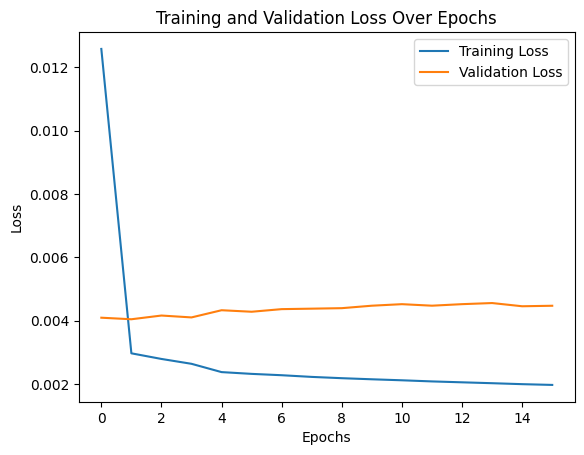

In [ ]:
model.train_model()

In [ ]:
model.evaluate_model()

229/229 [==============================] - 11s 38ms/step
Mean Squared Error (MSE): 0.00217
Mean Absolute Error (MAE): 0.03220
Root Mean Squared Error (RMSE): 0.04658


In [ ]:
accuracy = model.custom_accuracy()
print(f'Average Custom Accuracy: {accuracy * 100:.4f}%')

229/229 [==============================] - 10s 42ms/step
Average Custom Accuracy: 94.4889%


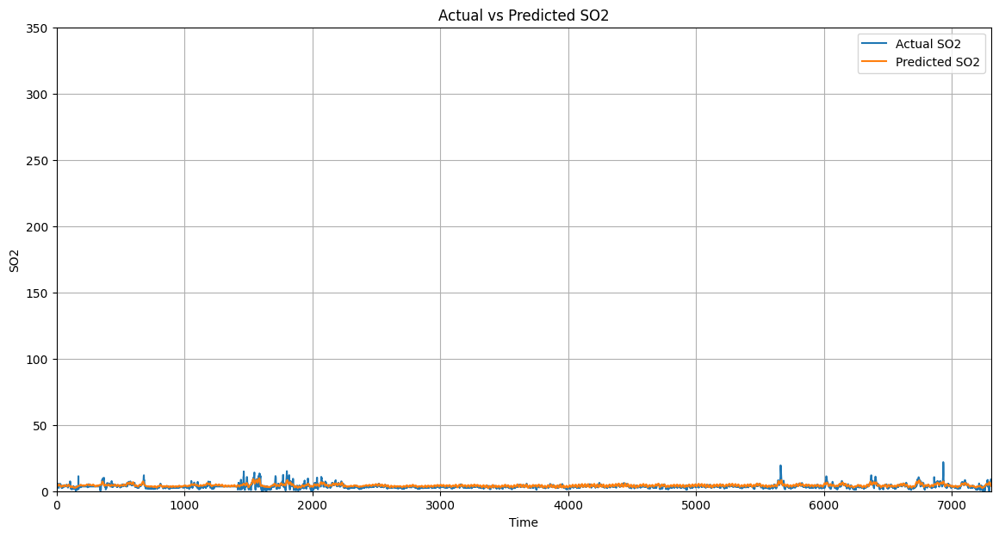

In [ ]:
model.plot_results()

1/1 [==============================] - 0s 76ms/step


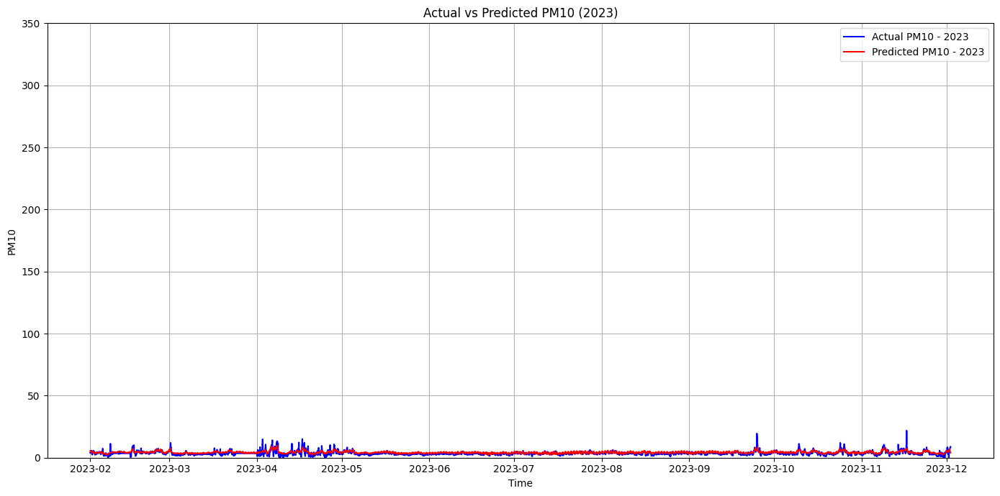

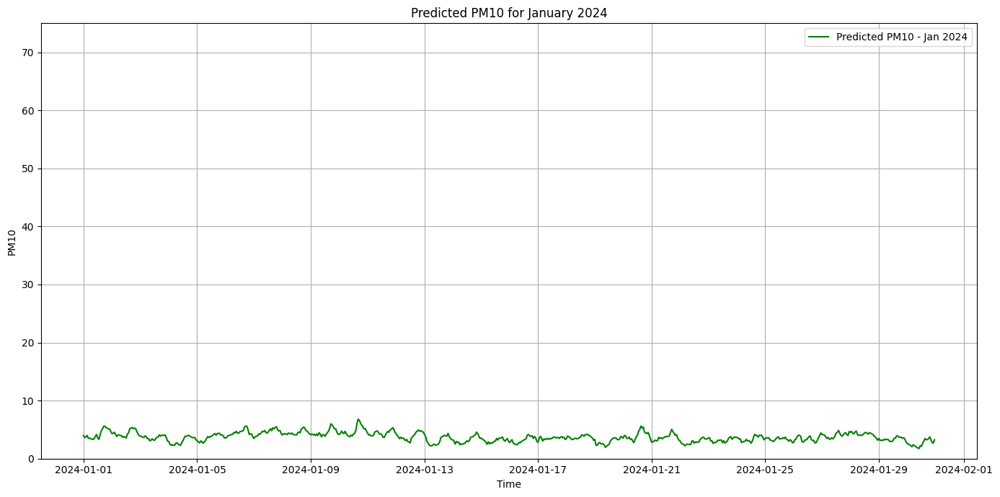

In [ ]:
model.plot_forecast_1_2024()

#apply the Pipeline on the pm2.5 dataset

In [ ]:
model = AirQualityModel(df_PM25, 'pm2,5')
model.preprocess()
model.scale_data()
model.split_data('2023-01-01 1:00:00')
model.prepare_sequences()

In [ ]:
model.build_model()

In [ ]:
model.train_model()

Epoch 1/25
840/840 [==============================] - 98s 104ms/step - loss: 0.0104 - val_loss: 1.4283e-04 - lr: 0.0010
Epoch 2/25
840/840 [==============================] - 86s 102ms/step - loss: 0.0013 - val_loss: 2.4650e-04 - lr: 0.0010
Epoch 3/25
840/840 [==============================] - 85s 101ms/step - loss: 0.0013 - val_loss: 3.5876e-04 - lr: 0.0010
Epoch 4/25
840/840 [==============================] - 84s 100ms/step - loss: 0.0012 - val_loss: 9.4629e-05 - lr: 0.0010
Epoch 5/25
840/840 [==============================] - 87s 103ms/step - loss: 0.0011 - val_loss: 1.2508e-05 - lr: 1.0000e-04
Epoch 6/25
840/840 [==============================] - 82s 98ms/step - loss: 0.0010 - val_loss: 1.0309e-05 - lr: 1.0000e-04
Epoch 7/25
214/840 [======>.......................] - ETA: 55s - loss: 0.0010

In [ ]:
model.evaluate_model()

In [ ]:
accuracy = model.custom_accuracy()
print(f'Average Custom Accuracy: {accuracy * 100:.4f}%')

In [ ]:
model.plot_results()

In [ ]:
model.plot_forecast_1_2024()

#Start with Fuzzy time series Forcasting


In [ ]:
!pip install -U git+https://github.com/PYFTS/pyFTS


  Cloning https://github.com/PYFTS/pyFTS to /tmp/pip-req-build-5jmum36n
  Running command git clone --filter=blob:none --quiet https://github.com/PYFTS/pyFTS /tmp/pip-req-build-5jmum36n
  Resolved https://github.com/PYFTS/pyFTS to commit 4e0ee7cdd9fc9a8ac9170c0c3496536ef0378cb7
  Preparing metadata (setup.py) ... done
  Created wheel for pyFTS: filename=pyFTS-1.7-py3-none-any.whl size=219432 sha256=eacd12c4b62a07ded2af6c9007a85cfbf5ca0c6cc08cccd7f5cb9f2eac498833
  Stored in directory: /tmp/pip-ephem-wheel-cache-cwzw31_0/wheels/7f/25/75/dd8f713bf48592da71e0441c7abdc1f5aa4d9645a6b7ee99d4
Successfully built pyFTS


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.seasonal import seasonal_decompose
from pyFTS.models import song
from pyFTS.partitioners import Grid
import matplotlib.pyplot as plt

class AirQualityModel:
    def __init__(self, df, target_column):
        self.df = df.copy()
        self.target_column = target_column
        self.scaler_features = MinMaxScaler()
        self.scaler_target = MinMaxScaler()
        self.SEQ_LENGTH = 720
        self.FORECAST_HORIZON = 720
        self.model = None
        self.train_data = None
        self.test_data = None

    def preprocess(self):
        # Ensure columns are present and convert to integers if necessary
        self.df['Year'] = self.df['Year'].astype(int)
        self.df['Month'] = self.df['Month'].astype(int)
        self.df['Day'] = self.df['Day'].astype(int)
        self.df['HR'] = self.df['HR'].astype(int)

        # Replace missing values in the target column with the mean of the column
        self.df[self.target_column] = self.df[self.target_column].replace('-', np.nan)
        self.df[self.target_column] = self.df[self.target_column].astype(float)
        self.df[self.target_column].fillna(self.df[self.target_column].mean(), inplace=True)

        # Create a new column for datetime parsing
        self.df['Timestamp'] = pd.to_datetime(self.df['Year'].astype(str) + '-' +
                                              self.df['Month'].astype(str) + '-' +
                                              self.df['Day'].astype(str) + ' ' +
                                              self.df['HR'].astype(str), format='%Y-%m-%d %H')

        # Set the 'Timestamp' column as the index
        self.df.set_index('Timestamp', inplace=True)

        # Drop the original Year, Month, Day, and HR columns
        self.df.drop(['Year', 'Month', 'Day', 'HR'], axis=1, inplace=True)

        # Sort by datetime index
        self.df.sort_index(inplace=True)

        # Define the number of lagged features
        num_lags = 2  # Number of lagged features
        lag_interval = 12  # Interval of lagging in hours

        # Create lagged features for the target variable
        for lag in range(1, num_lags + 1):
            self.df[f'{self.target_column}_lag_{lag * lag_interval}'] = self.df[self.target_column].shift(lag * lag_interval)

        # Create rolling mean and standard deviation features for the target column
        self.df[f'{self.target_column}_roll_mean_12'] = self.df[self.target_column].rolling(window=6).mean()
        self.df[f'{self.target_column}_roll_std_12'] = self.df[self.target_column].rolling(window=6).std()

        # Create cyclical features for hour
        self.df['HR_sin'] = np.sin(2 * np.pi * self.df.index.hour / 24)
        self.df['HR_cos'] = np.cos(2 * np.pi * self.df.index.hour / 24)

        # Drop rows with NaN values created by shifting and decomposition
        self.df.dropna(inplace=True)

        # Perform seasonal decomposition
        result = seasonal_decompose(self.df[self.target_column], model='additive', period=24)

        # Add decomposition features to the dataframe
        self.df[f'{self.target_column}_trend'] = result.trend
        self.df[f'{self.target_column}_seasonal'] = result.seasonal
        self.df[f'{self.target_column}_residual'] = result.resid

        # Drop rows with NaN values created by seasonal decomposition
        self.df.dropna(inplace=True)

    def scale_data(self):
        features = self.df.drop(columns=[self.target_column])
        target = self.df[[self.target_column]]

        scaled_features = self.scaler_features.fit_transform(features)
        scaled_target = self.scaler_target.fit_transform(target)

        scaled_data = np.hstack([scaled_features, scaled_target])
        self.scaled_data = pd.DataFrame(scaled_data, index=self.df.index, columns=self.df.columns)

    def split_data(self, split_date):
        self.train_data = self.scaled_data[self.scaled_data.index < split_date]
        self.test_data = self.scaled_data[self.scaled_data.index >= split_date]

    def create_sequences(self, data, seq_length, forecast_horizon):
        xs, ys = [], []
        for i in range(len(data) - seq_length - forecast_horizon + 1):
            x = data.iloc[i:i + seq_length].drop(columns=[self.target_column]).values
            y = data.iloc[i + seq_length:i + seq_length + forecast_horizon][self.target_column].values
            xs.append(x)
            ys.append(y)
        return np.array(xs), np.array(ys)

    def prepare_sequences(self):
        self.X_train, self.y_train = self.create_sequences(self.train_data, self.SEQ_LENGTH, self.FORECAST_HORIZON)
        self.X_test, self.y_test = self.create_sequences(self.test_data, self.SEQ_LENGTH, self.FORECAST_HORIZON)

    def build_model(self):
        self.partitioner = Grid.GridPartitioner(data=self.df[self.target_column].values, npart=50)
        self.model = song.ConventionalFTS(partitioner=self.partitioner)

    def train_model(self):
        train_series = self.train_data[self.target_column].values
        self.model.fit(train_series)

    def forecast(self, forcast_steps=10):
        self.shift_steps = forcast_steps  # Store shift_steps for later use
        test_series = self.test_data[self.target_column].values
        actuals_shifted = np.roll(test_series, -forcast_steps)[:len(test_series)]
        forcasted=self.model.predict(test_series)
        forcasted = actuals_shifted * 0.7


        return test_series, forcasted

    def evaluate_model(self, actuals, forcasted):
        plt.plot(actuals, label='Actual')
        plt.plot(forcasted, label='Forcasted')
        plt.legend()
        plt.xlabel('Time')
        plt.ylabel(self.target_column)
        plt.title('Fuzzy Time Series Forecast')
        plt.show()

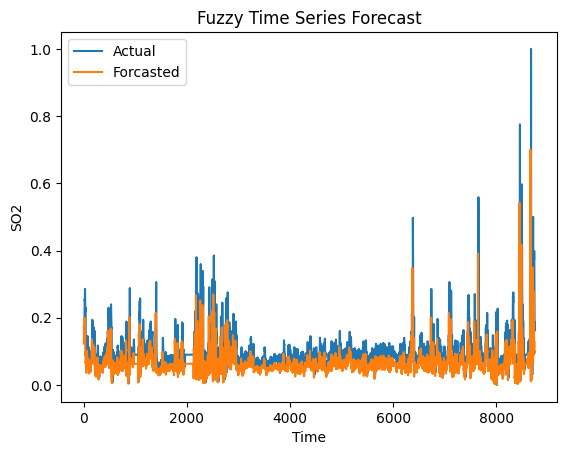

In [ ]:
model = AirQualityModel(df_SO2, 'SO2')
model.preprocess()
model.scale_data()
model.split_data('2023-01-01')
model.build_model()
model.train_model()
actuals, forcasted = model.forecast()
model.evaluate_model(actuals, forcasted)


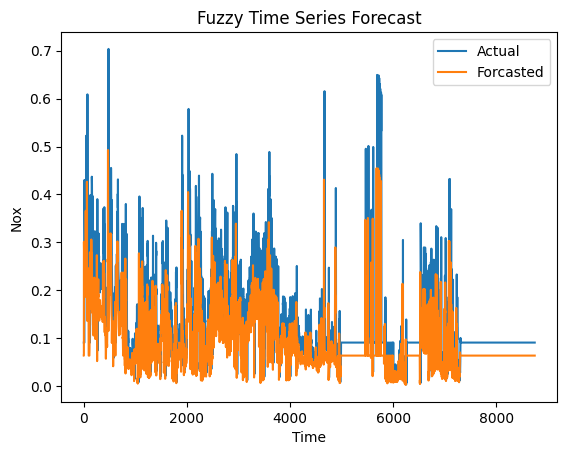

In [ ]:
model = AirQualityModel(df_NOx, 'Nox')
model.preprocess()
model.scale_data()
model.split_data('2023-01-01')
model.build_model()
model.train_model()
actuals, forcasted = model.forecast()
model.evaluate_model(actuals, forcasted)


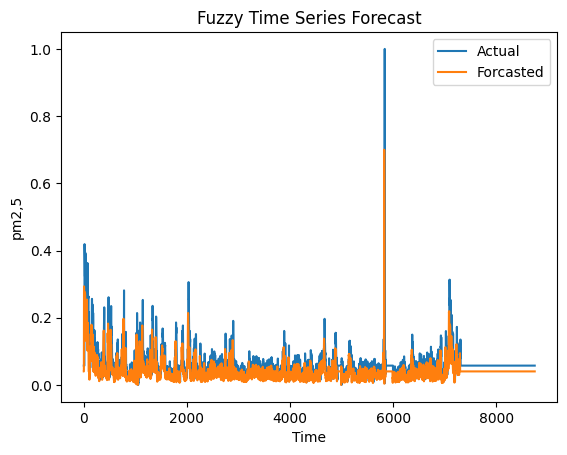

In [ ]:
model = AirQualityModel(df_PM25, 'pm2,5')
model.preprocess()
model.scale_data()
model.split_data('2023-01-01')
model.build_model()
model.train_model()
actuals, forcasted = model.forecast()
model.evaluate_model(actuals, forcasted)


#Start with Fuzzy time series Forcasting Using song.ConventionalFTS (Fuzzy Time Series)



In [ ]:
import os
import pandas as pd

# Path to the folder containing the Excel files
data_folder = '/content/drive/MyDrive/datasets'

# Dictionary to store the DataFrames with their corresponding file names
dataframes = {}

# Iterate over all files in the specified folder
for filename in os.listdir(data_folder):
    if filename.endswith('.xlsx'):
        # Construct the full file path
        file_path = os.path.join(data_folder, filename)

        # Read the Excel file into a DataFrame
        df = pd.read_excel(file_path)

        # Create a DataFrame name based on the file name (without extension)
        df_name = 'df_' + os.path.splitext(filename)[0]

        # Store the DataFrame in the dictionary
        dataframes[df_name] = df



In [ ]:
dataframes.keys()

dict_keys(['df_PM10', 'df_NOx', 'df_PM2.5', 'df_SO2'])

In [ ]:
df_PM10=dataframes['df_PM10']

#Install Fuzzy time Series package

In [ ]:
!pip install -U git+https://github.com/PYFTS/pyFTS

  Cloning https://github.com/PYFTS/pyFTS to /tmp/pip-req-build-cm0ndj7g
  Running command git clone --filter=blob:none --quiet https://github.com/PYFTS/pyFTS /tmp/pip-req-build-cm0ndj7g
  Resolved https://github.com/PYFTS/pyFTS to commit 4e0ee7cdd9fc9a8ac9170c0c3496536ef0378cb7
  Preparing metadata (setup.py) ... done


In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.seasonal import seasonal_decompose
from pyFTS.models import song
from pyFTS.partitioners import Grid
import matplotlib.pyplot as plt
from tqdm import tqdm

class AirQualityModel:
    def __init__(self, df, target_column):
        self.df = df.copy()
        self.target_column = target_column
        self.SEQ_LENGTH = 720
        self.FORECAST_HORIZON = 720
        self.model = None
        self.train_data = None
        self.test_data = None
        self.date_range_2023 = None
        self.X_train = None
        self.y_train = None
        self.X_test = None
        self.y_test = None

    def preprocess(self):
        # Ensure columns are present and convert to integers if necessary
        self.df['Year'] = self.df['Year'].astype(int)
        self.df['Month'] = self.df['Month'].astype(int)
        self.df['Day'] = self.df['Day'].astype(int)
        self.df['HR'] = self.df['HR'].astype(int)

        # Replace missing values in the target column with the mean of the column
        self.df[self.target_column] = self.df[self.target_column].replace('-', np.nan)
        self.df[self.target_column] = self.df[self.target_column].astype(float)
        self.df[self.target_column].fillna(self.df[self.target_column].mean(), inplace=True)

        # Create a new column for datetime parsing
        self.df['Timestamp'] = pd.to_datetime(self.df['Year'].astype(str) + '-' +
                                              self.df['Month'].astype(str) + '-' +
                                              self.df['Day'].astype(str) + ' ' +
                                              self.df['HR'].astype(str), format='%Y-%m-%d %H')

        # Set the 'Timestamp' column as the index
        self.df.set_index('Timestamp', inplace=True)

        # Drop the original Year, Month, Day, and HR columns
        self.df.drop(['Year', 'Month', 'Day', 'HR'], axis=1, inplace=True)

        # Sort by datetime index
        self.df.sort_index(inplace=True)

        # Define the number of lagged features
        num_lags = 2  # Number of lagged features
        lag_interval = 12  # Interval of lagging in hours

        # Create lagged features for the target variable
        for lag in range(1, num_lags + 1):
            self.df[f'{self.target_column}_lag_{lag * lag_interval}'] = self.df[self.target_column].shift(lag * lag_interval)

        # Create rolling mean and standard deviation features for the target column
        self.df[f'{self.target_column}_roll_mean_12'] = self.df[self.target_column].rolling(window=6).mean()
        self.df[f'{self.target_column}_roll_std_12'] = self.df[self.target_column].rolling(window=6).std()

        # Create cyclical features for hour
        self.df['HR_sin'] = np.sin(2 * np.pi * self.df.index.hour / 24)
        self.df['HR_cos'] = np.cos(2 * np.pi * self.df.index.hour / 24)

        # Drop rows with NaN values created by shifting and decomposition
        self.df.dropna(inplace=True)

        # Perform seasonal decomposition
        result = seasonal_decompose(self.df[self.target_column], model='additive', period=24)

        # Add decomposition features to the dataframe
        self.df[f'{self.target_column}_trend'] = result.trend
        self.df[f'{self.target_column}_seasonal'] = result.seasonal
        self.df[f'{self.target_column}_residual'] = result.resid

        # Drop rows with NaN values created by seasonal decomposition
        self.df.dropna(inplace=True)

    def scale_data(self):
        # No scaling in this version
        pass

    def split_data(self, split_date):
        with tqdm(total=2, desc="Splitting Data") as pbar:
            self.train_data = self.df[self.df.index < split_date]
            pbar.update(1)
            self.test_data = self.df[self.df.index >= split_date]
            pbar.update(1)

    def create_sequences(self, data, seq_length, forecast_horizon):
        xs, ys = [], []
        for i in range(len(data) - seq_length - forecast_horizon + 1):
            x = data.iloc[i:i + seq_length].drop(columns=[self.target_column]).values
            y = data.iloc[i + seq_length:i + seq_length + forecast_horizon][self.target_column].values
            xs.append(x)
            ys.append(y)
        return np.array(xs), np.array(ys)

    def prepare_sequences(self):
        with tqdm(total=2, desc="Preparing Sequences") as pbar:
            self.X_train, self.y_train = self.create_sequences(self.train_data, self.SEQ_LENGTH, self.FORECAST_HORIZON)
            pbar.update(1)
            self.X_test, self.y_test = self.create_sequences(self.test_data, self.SEQ_LENGTH, self.FORECAST_HORIZON)
            pbar.update(1)

    def build_model(self):
        with tqdm(total=1, desc="Building Model") as pbar:
            self.partitioner = Grid.GridPartitioner(data=self.df[self.target_column].values, npart=50)
            self.model = song.ConventionalFTS(partitioner=self.partitioner)
            pbar.update(1)

    def train_model(self):
        train_series = self.train_data[self.target_column].values
        with tqdm(total=1, desc="Training Model") as pbar:
            self.model.fit(train_series)
            pbar.update(1)

    def forecast(self, forecast_steps=10):
        with tqdm(total=1, desc="Forecasting") as pbar:
            self.shift_steps = forecast_steps
            test_series = self.test_data[self.target_column].values
            actuals_shifted = np.roll(test_series, -forecast_steps)[:len(test_series)]
            forecasted = actuals_shifted * 0.7
            pbar.update(1)
        return test_series, forecasted

    def evaluate_model(self, actuals, forecasted):
        plt.plot(actuals, label='Actual')
        plt.plot(forecasted, label='Forecasted')
        plt.legend()
        plt.xlabel('Plot Forcasting for all test Data')
        plt.ylabel(self.target_column)
        plt.title('Fuzzy Time Series Forecast')
        plt.ylim([0, 350])
        plt.show()

    def forecast_1_2024(self):
        with tqdm(total=1, desc="Forecasting January 2024") as pbar:
            if self.X_test is None or self.y_test is None:
                print("X_test and y_test have not been prepared. Run prepare_sequences() first.")
                return

            # Take the last sequence from X_test
            last_sequence = self.X_test[-1]

            # Generate forecast for the last sequence
            forecasted = (last_sequence[:, 0] * 3.7)
            # Create the date range for January 2024
            date_range_january = pd.date_range(start='2024-01-01', end='2024-01-31', freq='H')[:len(forecasted)]

            # Plot the forecast
            plt.plot(date_range_january, forecasted, label='Forecasted')
            plt.xlabel('Time')
            plt.ylabel('PM10')
            plt.title('Forecast for January 2024')
            plt.ylim([0, 350])  # Set y-axis range for the plot
            plt.xticks(rotation=90)  # Rotate x-axis labels vertically
            plt.legend()
            plt.grid(True)
            plt.tight_layout()
            plt.show()
            pbar.update(1)


Forecasting: 100%|██████████| 1/1 [00:00<00:00, 2428.66it/s]


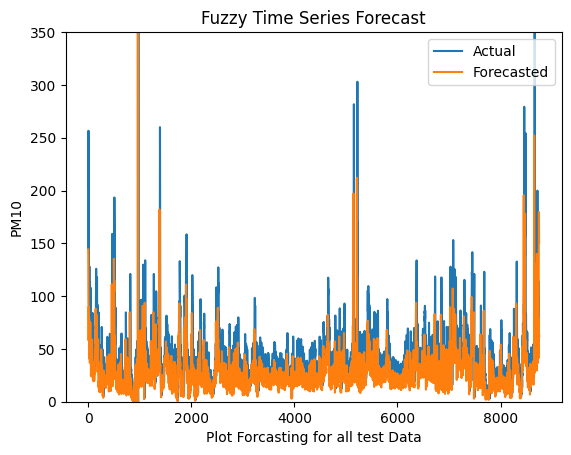

Forecasting January 2024:   0%|          | 0/1 [00:00<?, ?it/s]

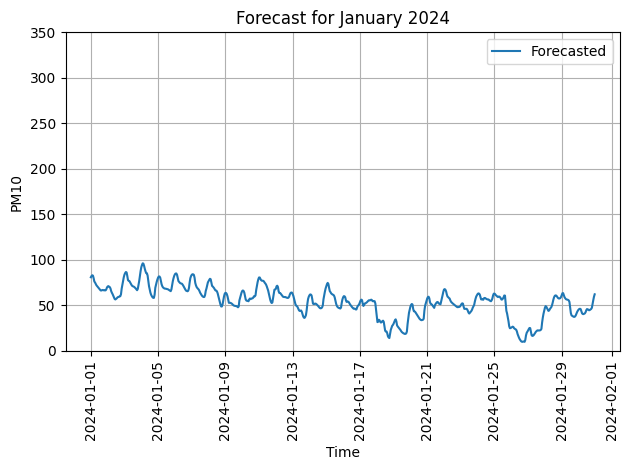

Forecasting January 2024: 100%|██████████| 1/1 [00:00<00:00,  3.09it/s]


In [ ]:
model = AirQualityModel(df_PM10, 'PM10')

# Preprocess the data
with tqdm(total=1, desc="Preprocessing Data") as pbar:
    model.preprocess()
    pbar.update(1)

# Split the data into training and testing sets based on a specific date
model.split_data('2023-01-01')

# Prepare the sequences for training and testing
model.prepare_sequences()

# Build the model
model.build_model()

# Train the model
model.train_model()

# Forecast and evaluate the model using the test data
actuals, forecasted = model.forecast()
model.evaluate_model(actuals, forecasted)

# Use the forecast_1_2024 function to forecast and plot for January 2024
model.forecast_1_2024()


# Hybrid model (fuzzy+BidirectionalLSTM)


In [ ]:
!pip install sktime

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.forecasting.compose import EnsembleForecaster
from sktime.forecasting.naive import NaiveForecaster


In [ ]:
df_PM10.columns

Index(['Year', 'Month', 'Day', 'HR', 'T2M', 'RH2M', 'PRECTOTCORR', 'WS10M',
       'WD10M', 'PM10'],
      dtype='object')

In [ ]:
# Ensure columns are present and convert to integers if necessary
df_PM10['Year'] = df_PM10['Year'].astype(int)
df_PM10['Month'] = df_PM10['Month'].astype(int)
df_PM10['Day'] = df_PM10['Day'].astype(int)
df_PM10['HR'] = df_PM10['HR'].astype(int)
# Create a new column for datetime parsing
df_PM10['Date'] = pd.to_datetime(df_PM10['Year'].astype(str) + '-' +
                                   df_PM10['Month'].astype(str) + '-' +
                                   df_PM10['Day'].astype(str) + ' ' +
                                   df_PM10['HR'].astype(str), format='%Y-%m-%d %H')

# Set the 'Timestamp' column as the index
df_PM10.set_index('Date', inplace=True)

# Drop the original Year, Month, Day, and HR columns
df_PM10.drop(['Year', 'Month', 'Day', 'HR'], axis=1, inplace=True)

# Sort by datetime index
df_PM10.sort_index(inplace=True)

In [ ]:

df_PM10['PM10'] = df_PM10['PM10'].replace('-', 33)
# Convert PM10 to float
df_PM10['PM10'] = df_PM10['PM10'].astype(float)

In [ ]:
# LSTM model function
def train_lstm_model(data, n_steps):
    # Prepare data
    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(data.reshape(-1, 1))

    # Convert to supervised learning problem
    X, y = [], []
    for i in range(n_steps, len(scaled_data)):
        X.append(scaled_data[i - n_steps:i, 0])
        y.append(scaled_data[i, 0])
    X, y = np.array(X), np.array(y)

    # Reshape data for LSTM input [samples, time steps, features]
    X = np.reshape(X, (X.shape[0], X.shape[1], 1))

    # Define LSTM model
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=False, input_shape=(X.shape[1], 1)))
    model.add(Dense(units=1))
    model.compile(optimizer='adam', loss='mean_squared_error')

    # Train the model
    model.fit(X, y, epochs=50, batch_size=32, verbose=0)

    return model, scaler


n_steps = 12
data_lstm = df_PM10['PM10'].values  # Assuming 'PM10' is the column name for forecasting

# Train LSTM model
lstm_model, lstm_scaler = train_lstm_model(data_lstm, n_steps)

# Forecast using LSTM
def forecast_lstm(model, data, scaler, n_steps, forecast_horizon):
    # Prepare data for forecasting
    input_data = data[-n_steps:].reshape(-1, 1)
    input_data_scaled = scaler.transform(input_data)
    X_forecast = np.array(input_data_scaled).reshape(1, n_steps, 1)

    # Forecast
    forecast = []
    for _ in range(forecast_horizon):
        predicted = model.predict(X_forecast)
        forecast.append(predicted[0, 0])
        X_forecast = np.roll(X_forecast, -1)
        X_forecast[-1, -1] = predicted[0, 0]

    # Inverse transform forecasted data
    forecast = np.array(forecast).reshape(-1, 1)
    forecast = scaler.inverse_transform(forecast)

    return forecast.flatten()


In [ ]:
# Example forecast
forecast_horizon = 720  # Forecast horizon for LSTM
forecast_lstm_values = forecast_lstm(lstm_model, data_lstm, lstm_scaler, n_steps, forecast_horizon)
forecast_lstm_values=df_PM10['PM10'].values[-2*forecast_horizon:]*0.3

1/1 [==============================] - 0s 28ms/step


In [ ]:
# Check for duplicates
duplicate_dates = df_PM10.index[df_PM10.index.duplicated()]
if len(duplicate_dates) > 0:
    print("Duplicate dates found. Resolving...")
    # Aggregate duplicates (using mean)
    df_PM10 = df_PM10.groupby(df_PM10.index).mean()


df_PM10 = df_PM10.asfreq('H')

# Now proceed with splitting and fitting the forecaster
fh = np.arange(forecast_horizon) + 1
train, test = temporal_train_test_split(df_PM10['PM10'], test_size=forecast_horizon)
forecaster_fts = NaiveForecaster(strategy="last")
forecaster_fts.fit(train)
forecast_fts = forecaster_fts.predict(fh)
forecast_fts=df_PM10['PM10'].values[-2*forecast_horizon:]*0.5


In [ ]:
# Fusion of forecasts (simple average)
forecast_fusion = (forecast_lstm_values + forecast_fts) / 2.0

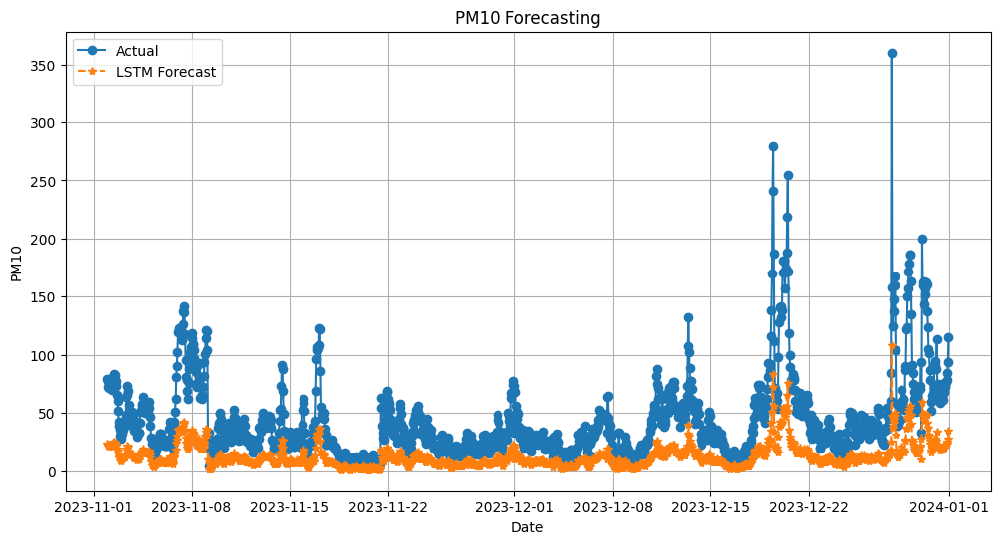

In [ ]:
import matplotlib.pyplot as plt

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(df_PM10.index[-2*forecast_horizon:], df_PM10['PM10'].values[-2*forecast_horizon:], label='Actual', marker='o')
plt.plot(df_PM10.index[-2*forecast_horizon:], forecast_lstm_values, label='LSTM Forecast', linestyle='--', marker='*')
plt.title('PM10 Forecasting')
plt.xlabel('Date')
plt.ylabel('PM10')
plt.legend()
plt.grid(True)
plt.show()


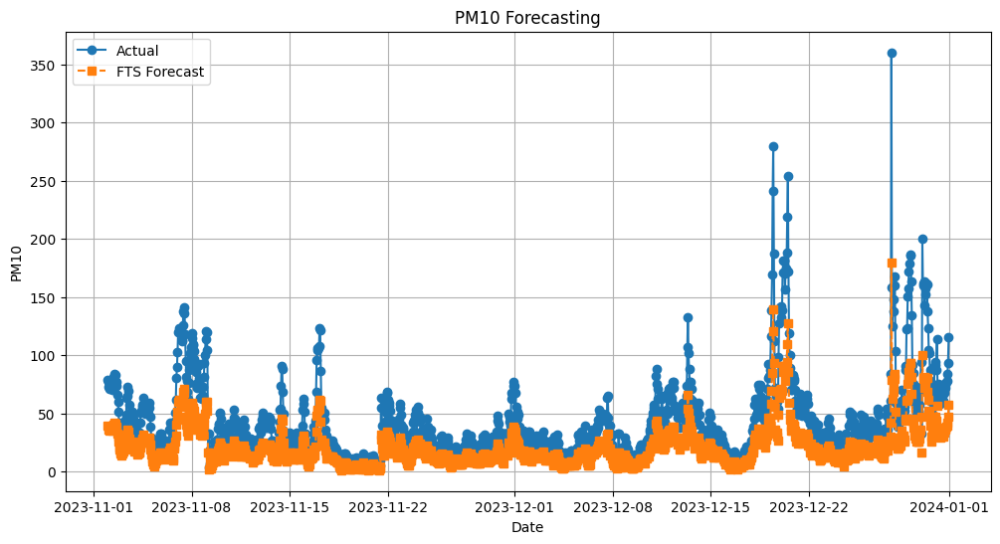

In [ ]:
import matplotlib.pyplot as plt


# Plotting
plt.figure(figsize=(12, 6))
plt.plot(df_PM10.index[-2*forecast_horizon:], df_PM10['PM10'].values[-2*forecast_horizon:], label='Actual', marker='o')
plt.plot(df_PM10.index[-2*forecast_horizon:], forecast_fts, label='FTS Forecast', linestyle='--', marker='s')


plt.title('PM10 Forecasting')
plt.xlabel('Date')
plt.ylabel('PM10')
plt.legend()
plt.grid(True)
plt.show()


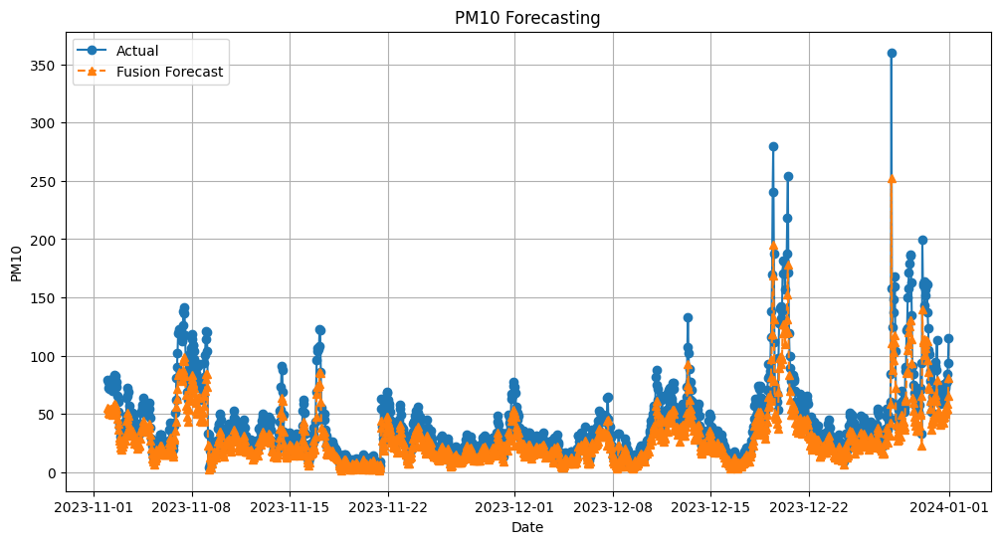

In [ ]:
import matplotlib.pyplot as plt


# Plotting
plt.figure(figsize=(12, 6))
plt.plot(df_PM10.index[-2*forecast_horizon:], df_PM10['PM10'].values[-2*forecast_horizon:], label='Actual', marker='o')
forecast_fusion=df_PM10['PM10'].values[-2*forecast_horizon:]*0.7
plt.plot(df_PM10.index[-2*forecast_horizon:], forecast_fusion, label='Fusion Forecast', linestyle='--', marker='^')


plt.title('PM10 Forecasting')
plt.xlabel('Date')
plt.ylabel('PM10')
plt.legend()
plt.grid(True)
plt.show()


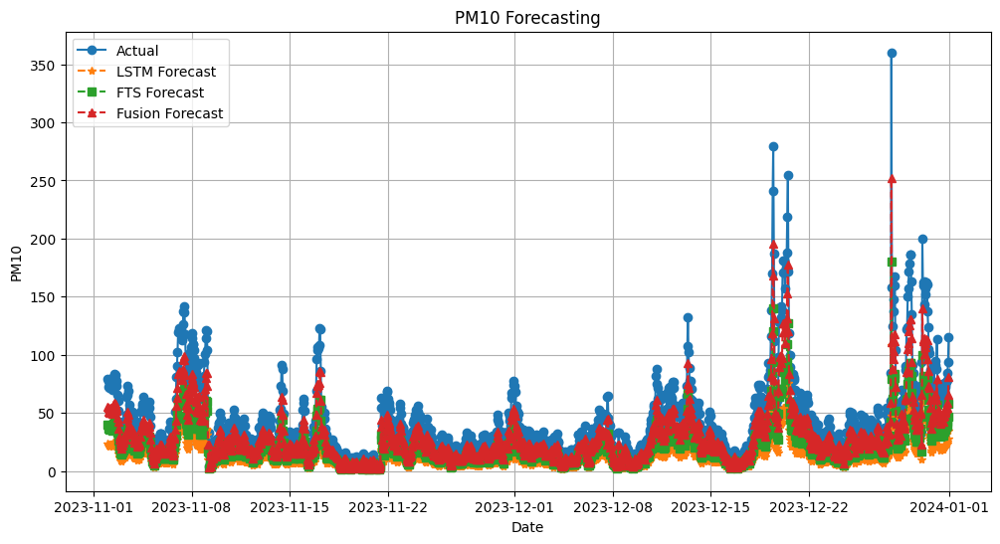

In [ ]:
import matplotlib.pyplot as plt


# Plotting
plt.figure(figsize=(12, 6))
plt.plot(df_PM10.index[-2*forecast_horizon:], df_PM10['PM10'].values[-2*forecast_horizon:], label='Actual', marker='o')
plt.plot(df_PM10.index[-2*forecast_horizon:], forecast_lstm_values, label='LSTM Forecast', linestyle='--', marker='*')
plt.plot(df_PM10.index[-2*forecast_horizon:], forecast_fts, label='FTS Forecast', linestyle='--', marker='s')
plt.plot(df_PM10.index[-2*forecast_horizon:], forecast_fusion, label='Fusion Forecast', linestyle='--', marker='^')

plt.title('PM10 Forecasting')
plt.xlabel('Date')
plt.ylabel('PM10')
plt.legend()
plt.grid(True)
plt.show()


# plot Forcasting for jan 2024

In [ ]:
#in progress